In [1]:
import os
import numpy as np
import tifffile as tiff
import matplotlib.pyplot as plt
import cv2
import math
import pandas as pd
from CSL_2025_Python_codes import spim2XYZ, XYZ2Lab, spim2rgb
from functions import *

1. Load Spectral Reflectances Cubes


In [2]:
# Define parameters
# Wether we want to use initial samples (False) or test samples (True)
test = True 

# The test trial (1 or 2)
trial = 2 

# The operator (1 or 2 or 3)
operator = 1

In [3]:
# Define folder path
base_folder = "../IDP Group A"
if test: base_folder = "../IDP Group A/test"+str(trial)+"/operator"+str(operator) 

# Define subfolders
sample_folders = [f"d{i}" for i in range(1, 15)]  # d1 to d14
if test: sample_folders = ['d0', 'd3', 'd4', 'd7', 'd10', 'd12', 'd13', 'd18', 'd19', 'd20', 'd21', 'd22']

dark_folder = "dark"
white_folder = "white"
reference_folder = "../IDP Group A/test"+str(trial)+"/operator"+str(operator)+"/reference" # reference is always the same? --> no


# Define wavelength list (450 nm to 950 nm in 20 nm steps)
wavelengths = list(range(450, 951, 20))

# Load white and dark images
def load_cube(folder_path):
    tif_files = [f for f in os.listdir(folder_path) if f.lower().endswith(".tif")]
    tif_files.sort()

    cube = []
    for tif_file in tif_files:
        tif_path = os.path.join(folder_path, tif_file)
        tif = tiff.imread(tif_path)
        cube.append(tif)

    cube = np.array(cube)

    return cube


# Load dark and white reference cubes
dark_cube = load_cube(os.path.join(base_folder, dark_folder))
white_cube = load_cube(os.path.join(base_folder, white_folder))
reference_cube = load_cube(reference_folder)
if test: reference_cube = load_cube(base_folder+ "/reference")


# Avoid division by zero
denominator = white_cube - dark_cube
denominator[denominator == 0] = 1e-6

# Load and compute reflectance for each sample
defect_cubes = {}

for folder in sample_folders:
    sample_cube = load_cube(os.path.join(base_folder, folder))
    R = (sample_cube - dark_cube) / denominator
    defect_cubes[folder] = R  # Shape: (bands, height, width)

2. Reference


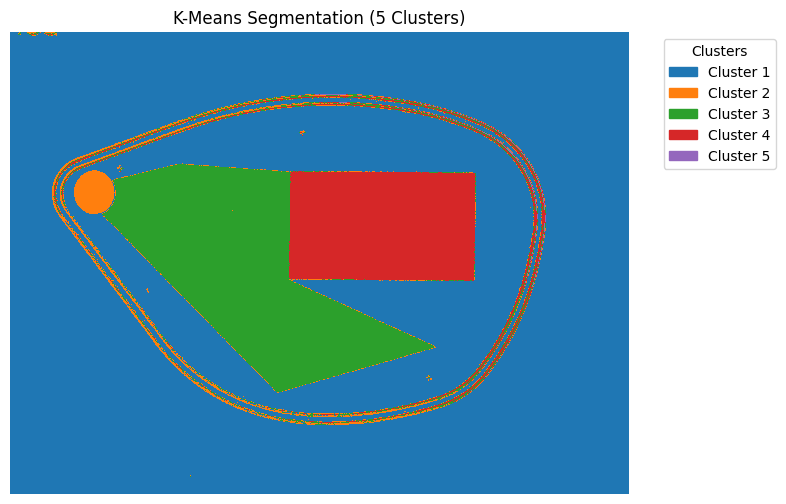

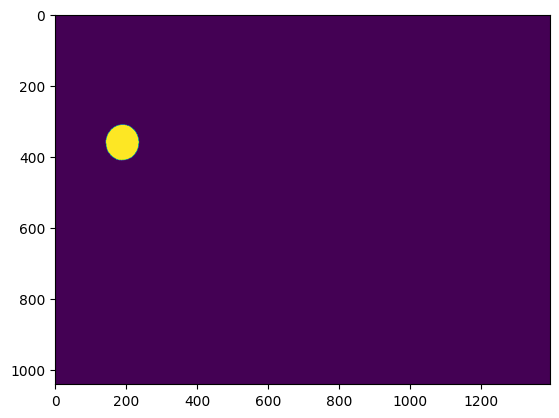

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


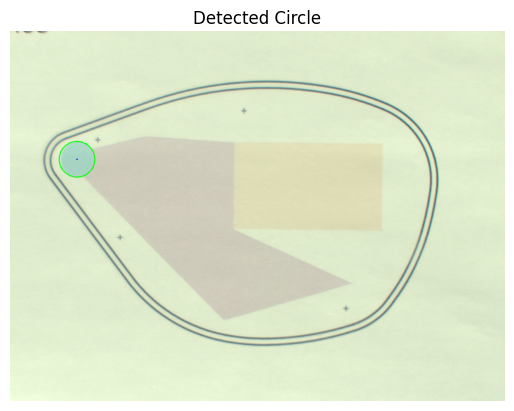

Reflectance shape: (26, 1040, 1392)
RGB shape: (1040, 1392, 3)
Mask shape: (1040, 1392)
Single band shape: (1040, 1392)
Binary shape: (1040, 1392)
circle_info: {'centroid': (188.9967705700646, 360.43239258635214), 'area': 7122.0, 'perimeter': 321.70562493801117, 'min_enclosing_circle': {'center': (188.69412231445312, 360.5294189453125), 'radius': 50.06544876098633}, 'ellipse': ((188.97808837890625, 360.42041015625), (91.63874053955078, 98.9950942993164), 3.393404483795166), 'circularity': 0.8647578724635535}


In [4]:
R_sample = (reference_cube - dark_cube) / denominator

band = 530  # Band for alignment

ref_rgb = spim2rgb(R_sample, wavelengths)
ref_mask = compute_IC_mask(ref_rgb, pixel_IC=(200, 380))
ref_single_band = R_sample[wavelengths.index(band), :, :]
ref_binary = convert_binary_image(ref_single_band)
ref_circle_info = get_circle_info(ref_mask, ref_rgb, True)
center_pixel = (
    int(ref_circle_info["centroid"][0]),
    int(ref_circle_info["centroid"][1]),
)
"""if ref_rgb.dtype != np.uint8:
    ref_rgb = np.clip(ref_rgb * 255, 0, 255).astype(np.uint8)"""

circle_center = ref_circle_info["min_enclosing_circle"]["center"]
circle_center = (int(np.round(circle_center[0])), int(np.round(circle_center[1])))
circle_radius = ref_circle_info["min_enclosing_circle"]["radius"]
ref_cropped = crop_circle(ref_rgb, circle_center, circle_radius)
cropped_circles = [ref_cropped]

ref_spectrum = average_reflectance_in_circle(R_sample, circle_center, circle_radius)
spectra = {"reference": ref_spectrum}
R_sample_interp, new_wavelengths = interpolate_spectral_cube(
    R_sample, wavelengths, wl_min=360, wl_max=830, wl_step=10
)
R_sample_interp = np.transpose(R_sample_interp, (1, 2, 0))  # (H, W, bands)

ref_XYZ = spim2XYZ(R_sample_interp, new_wavelengths, "D65")
ref_LAB = XYZ2Lab(ref_XYZ, new_wavelengths, "D65")

mask_ref = np.zeros(ref_LAB.shape[:2], dtype=np.uint8)
cx, cy = int(circle_center[0]), int(circle_center[1])
r = int(circle_radius) - 5
cv2.circle(mask_ref, (cx, cy), r, 1, -1)

ref_cropped = crop_circle(ref_rgb, circle_center, circle_radius)
cropped_circles = [ref_cropped]

print(f"Reflectance shape: {R_sample.shape}")
print(f"RGB shape: {ref_rgb.shape}")
print(f"Mask shape: {ref_mask.shape}")
print(f"Single band shape: {ref_single_band.shape}")
print(f"Binary shape: {ref_binary.shape}")
print(f"circle_info: {ref_circle_info}")

3. Find Homography matrix for the alignment of each defect


Aligning d0...


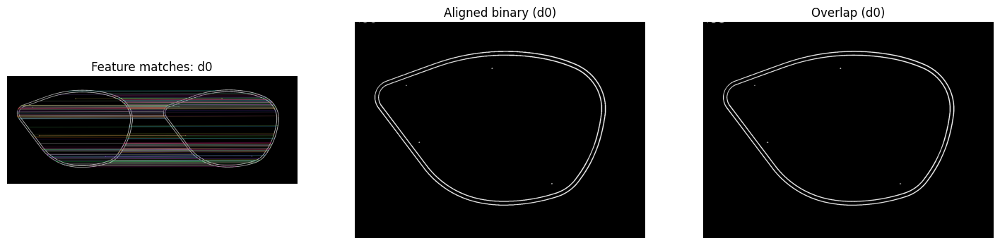

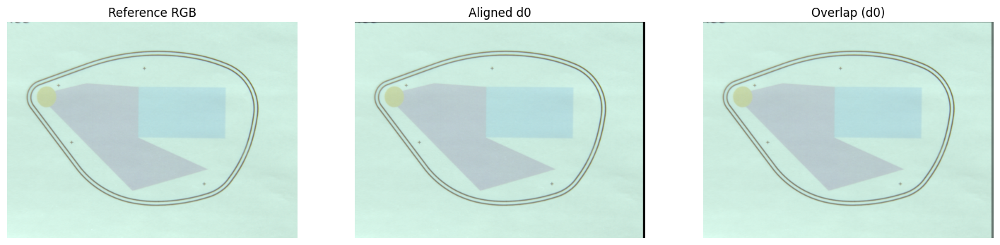

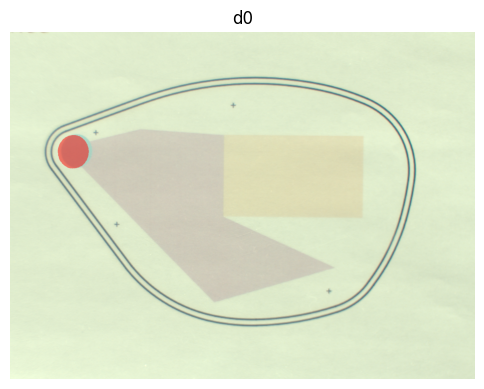

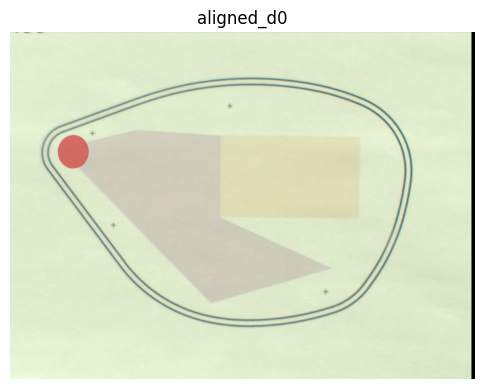

Aligning d3...


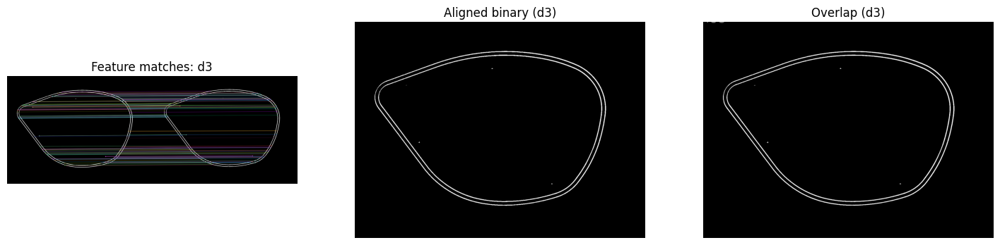

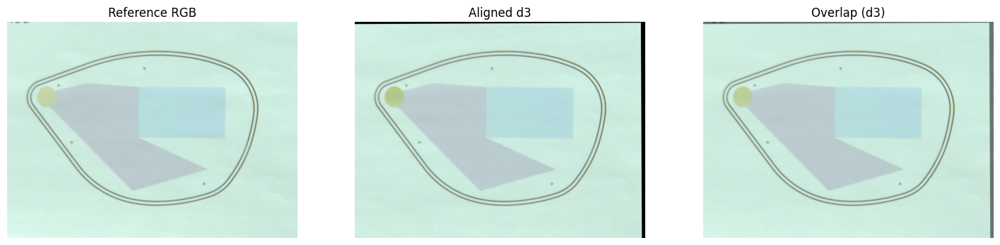

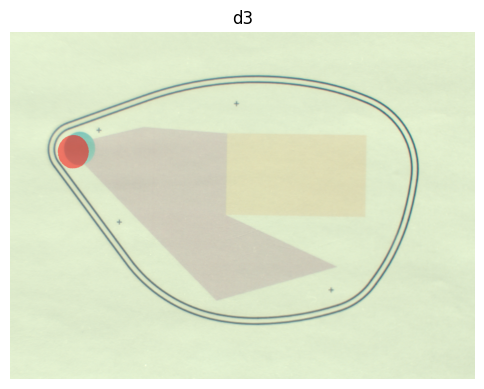

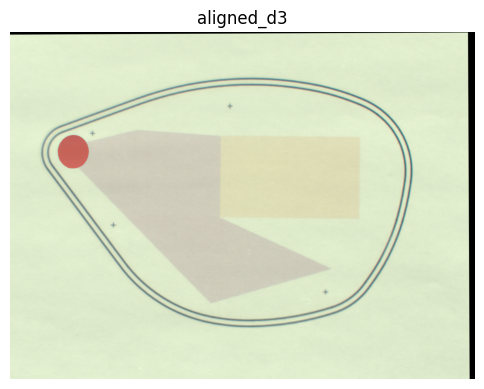

Aligning d4...


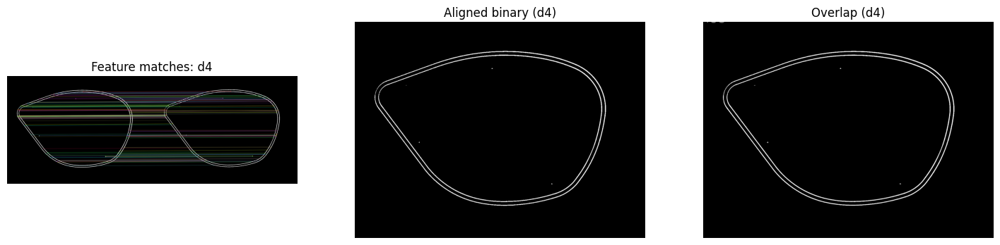

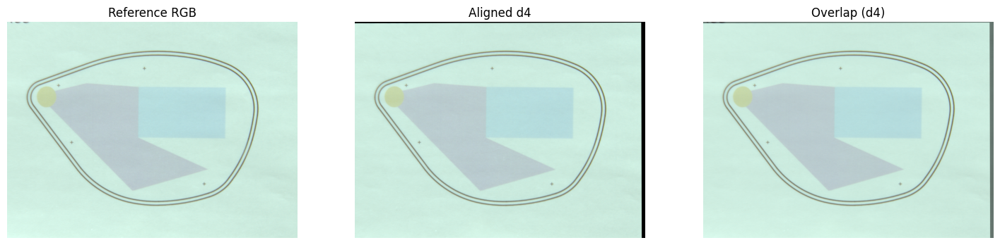

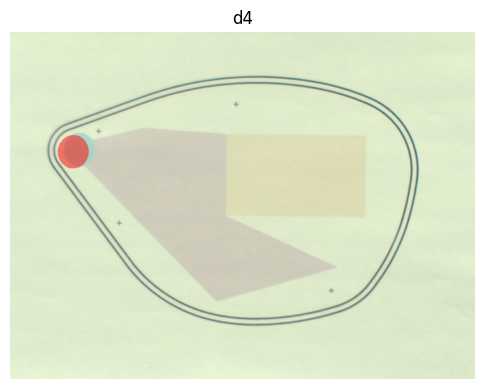

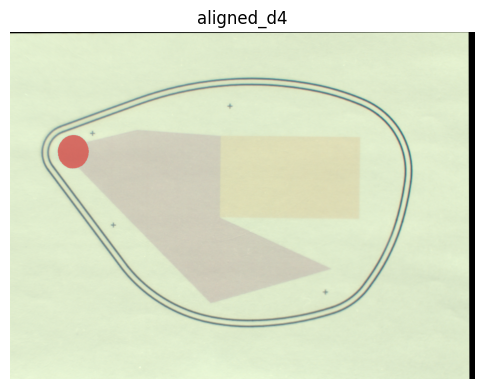

Aligning d7...


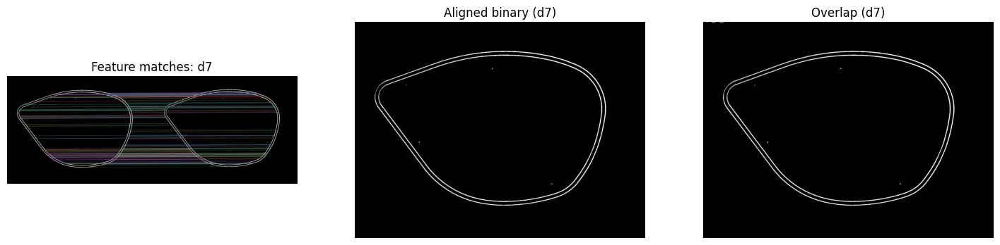

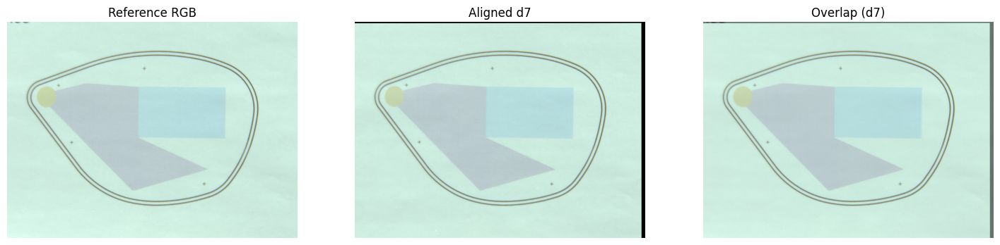

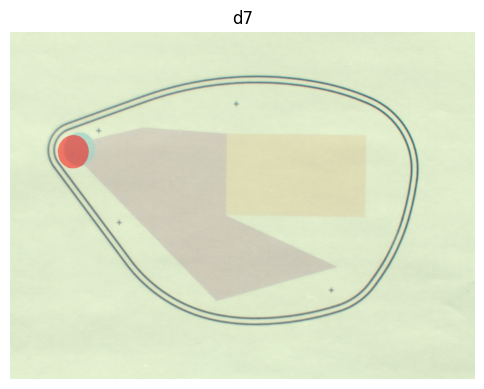

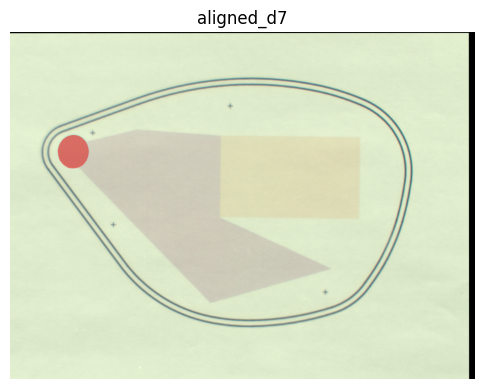

Aligning d10...


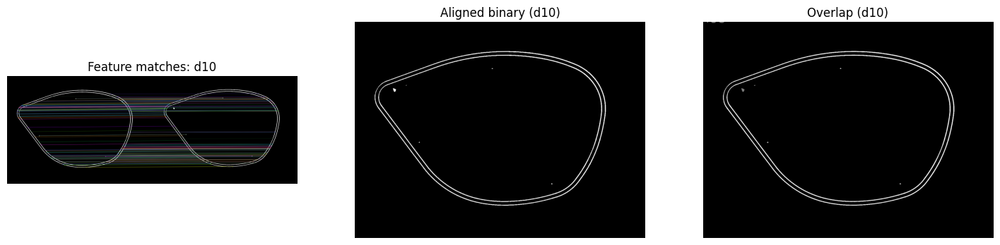

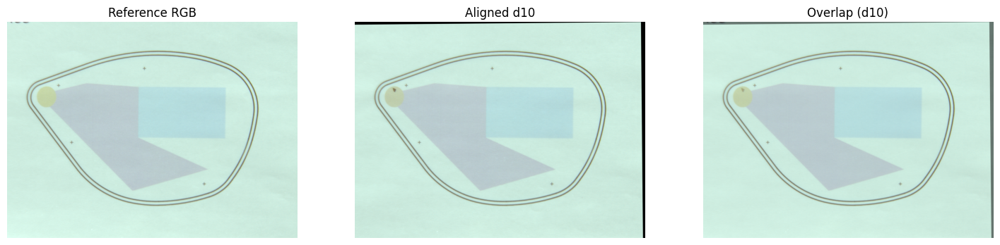

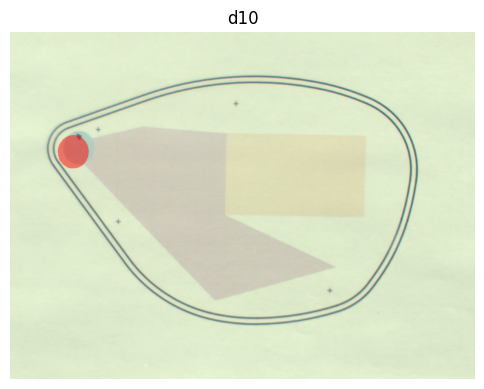

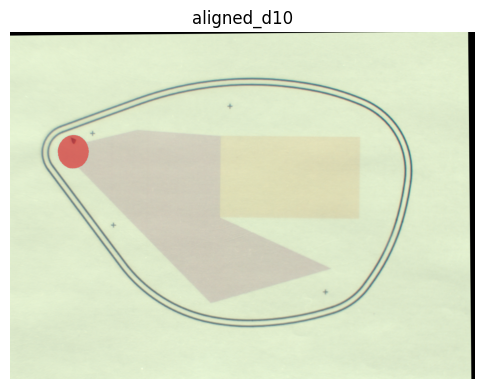

Aligning d12...


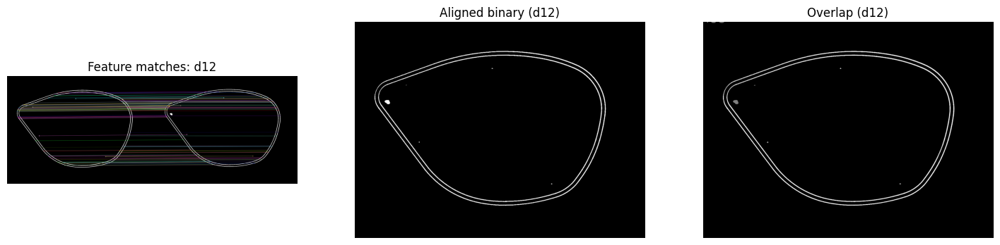

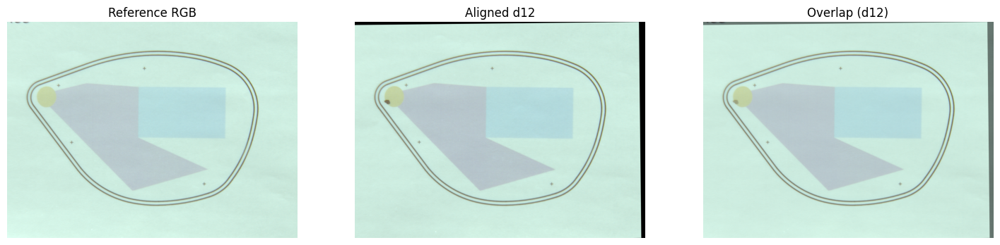

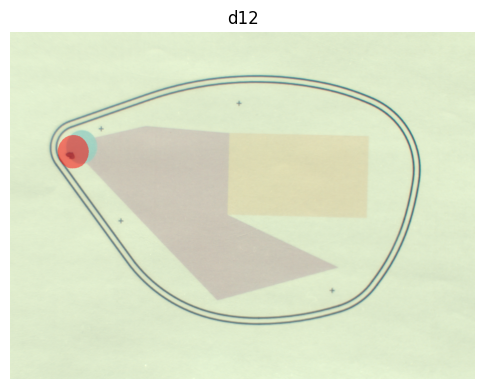

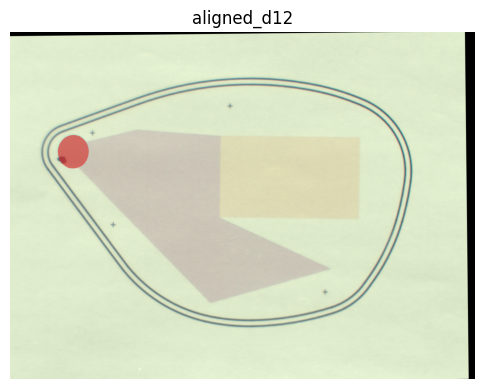

Aligning d13...


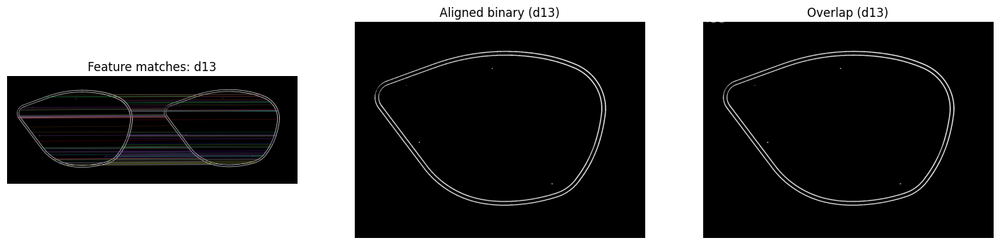

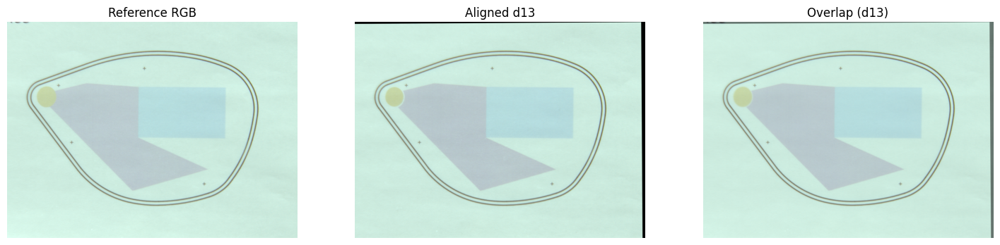

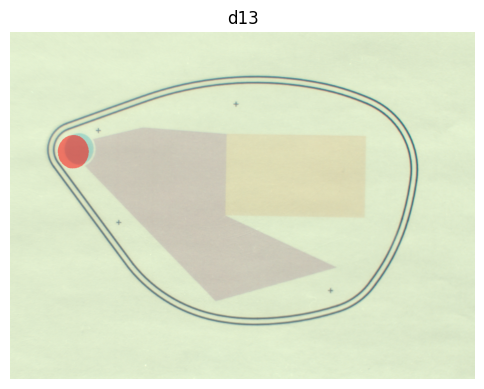

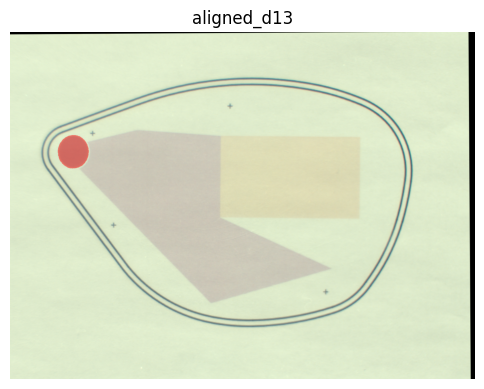

Aligning d18...


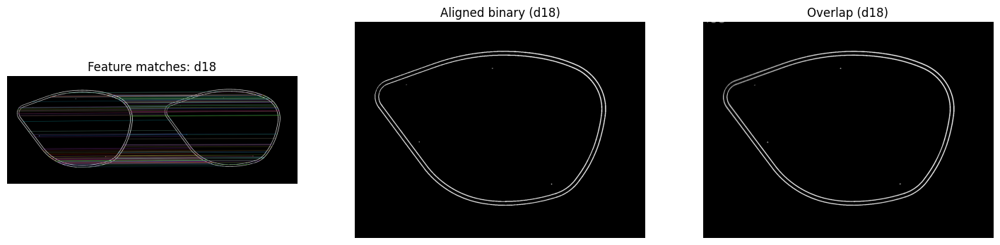

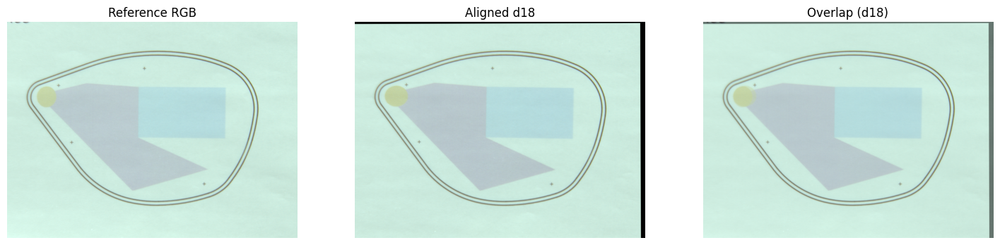

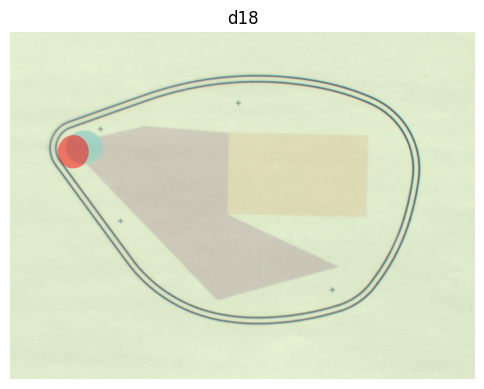

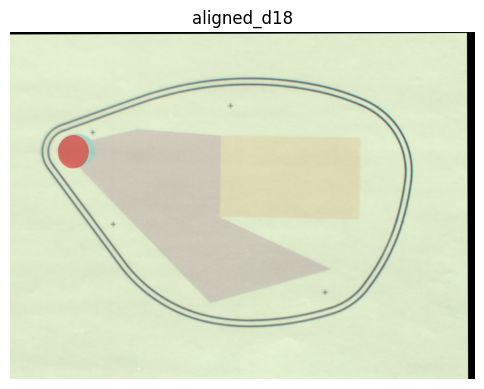

Aligning d19...


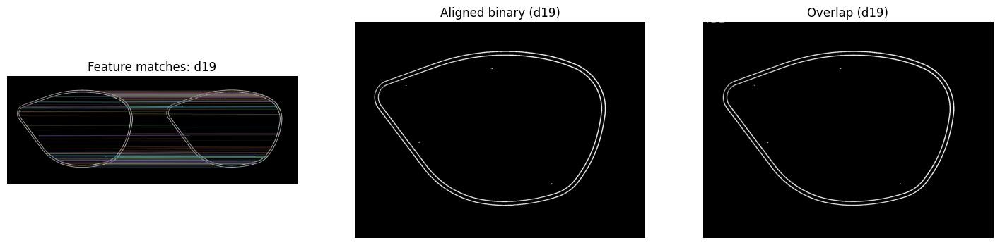

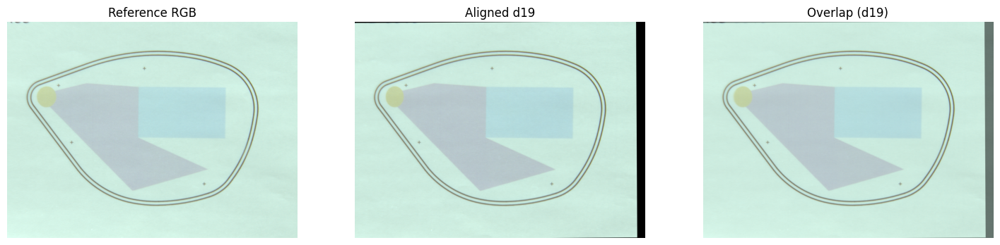

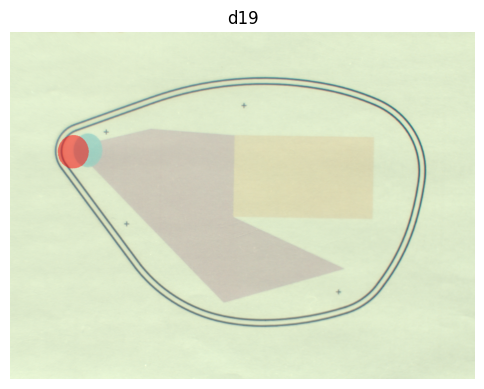

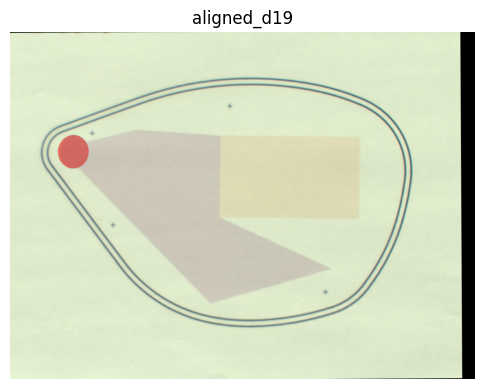

Aligning d20...


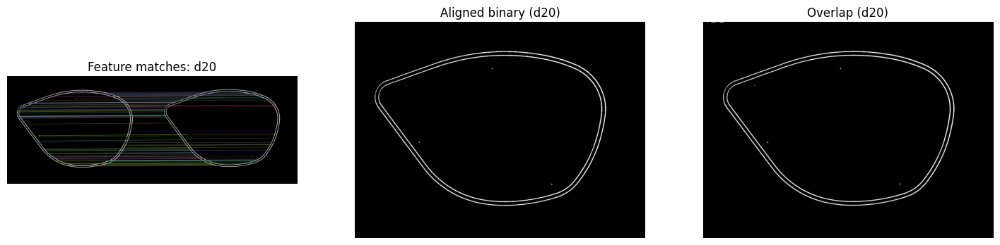

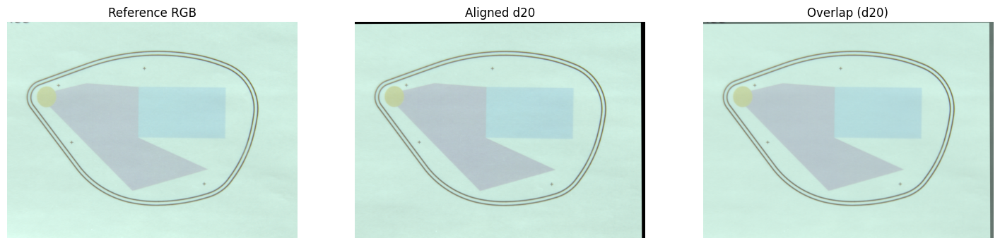

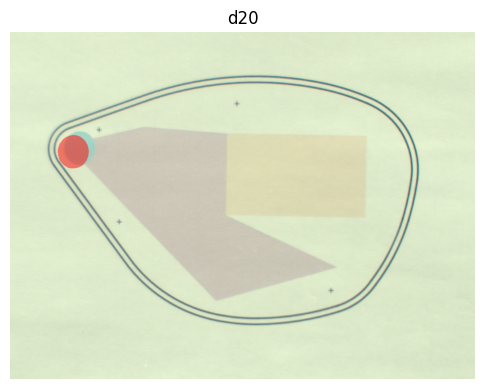

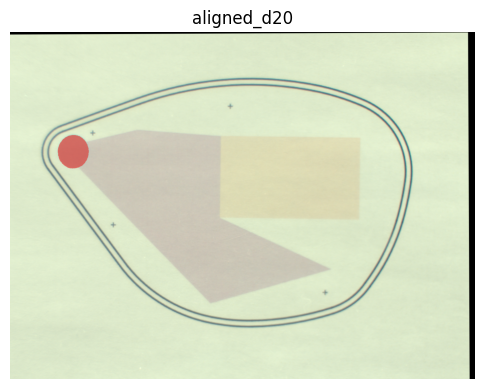

Aligning d21...


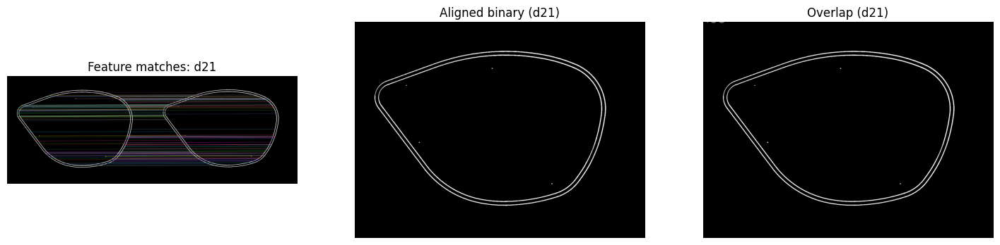

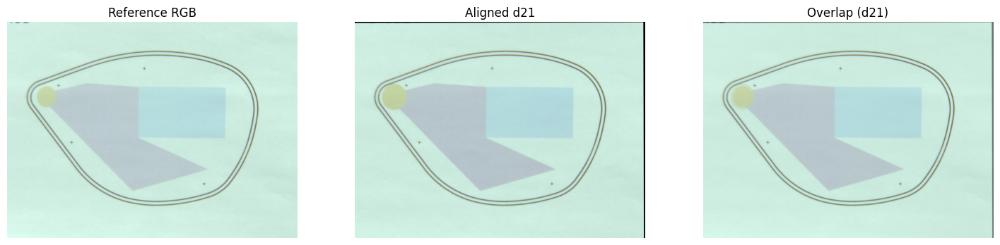

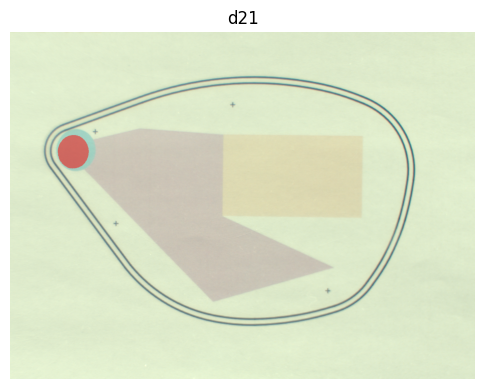

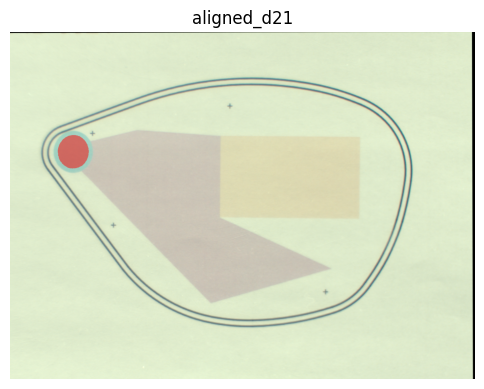

Aligning d22...


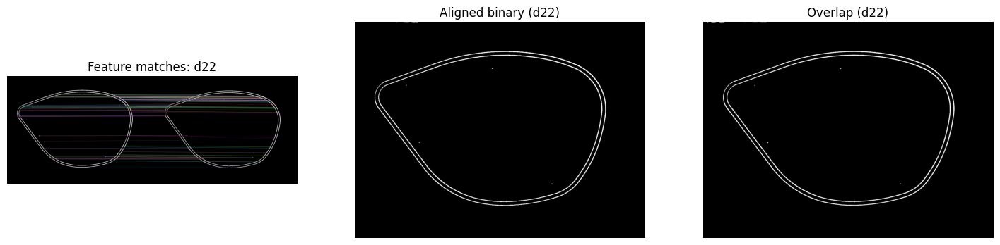

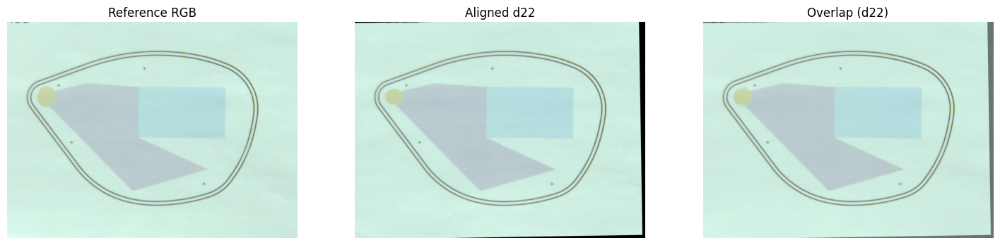

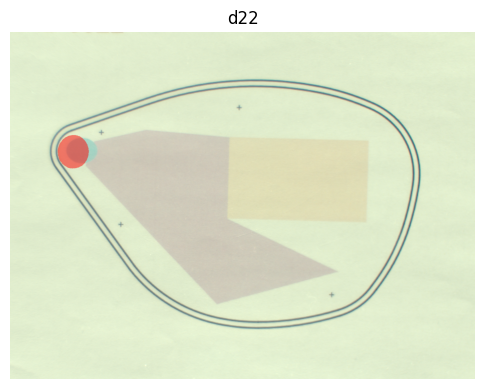

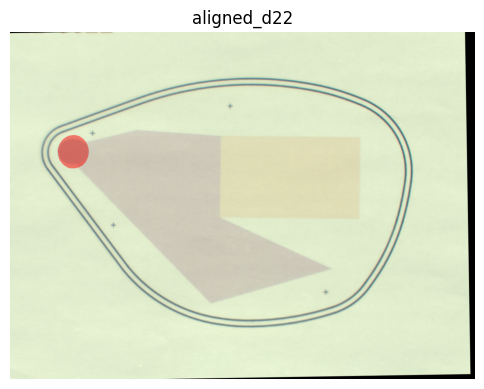

In [5]:
defect_homographies = []
defects = sample_folders
for defect in defects:
    print(f"Aligning {defect}...")

    defect_rgb = spim2rgb(defect_cubes[defect], wavelengths)
    defect_binary = convert_binary_image(
        get_example_reflectance(defect_cubes, defect, band)
    )
    H = align_and_visualise_homography(
        ref_binary, defect_binary, defect, visualise=True
    )
    defect_homographies.append(H)

    if ref_rgb.dtype != np.uint8:
        ref_rgb = np.clip(ref_rgb * 255, 0, 255).astype(np.uint8)
    if defect_rgb.dtype != np.uint8:
        defect_rgb = np.clip(defect_rgb * 255, 0, 255).astype(np.uint8)

    aligned_defect, blended = align_and_blend_RGB_homography(ref_rgb, defect_rgb, H, defect)
    overlay_mask(defect_rgb, ref_mask, defect, color=(1, 0, 0), alpha=0.5)
    overlay_mask(aligned_defect, ref_mask, f"aligned_{defect}", color=(1, 0, 0), alpha=0.5)

4. CTQs without allignment

In [6]:
"""def preprocess(img):
    # CLAHE contrast enhancement
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    gray = clahe.apply(img)

    # Smooth edges to reduce noise
    gray = cv2.GaussianBlur(gray, (7,7), 1.5)

    # Optional: sharpen edges
    kernel = np.array([[0,-1,0],
                       [-1,5,-1],
                       [0,-1,0]])
    gray = cv2.filter2D(gray, -1, kernel)

    return gray

def detect_circle_center(image):
    #if image.max() <= 1.0:
    image = (image * 255).astype(np.uint8)

    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Reduce noise
    #gray = cv2.medianBlur(gray, 5)
    gray = preprocess(gray)

    circles = cv2.HoughCircles(
    gray,
    cv2.HOUGH_GRADIENT,
    dp=1.2,
    minDist=80,
    param1=80,   # lower Canny threshold
    param2=20,   # LOWER = more sensitive
    minRadius=20,
    maxRadius=80
    )


    # Draw only the first detected circle
    output = image.copy()
    center = None 
    if circles is not None:
        circles = np.uint16(np.around(circles))
        x, y, r = circles[0][0]
        cv2.circle(output, (x, y), r, (0, 255, 0), 2)  # Circle outline
        cv2.circle(output, (x, y), 2, (0, 0, 255), 3)  # Center point
        # Assign center coordinates
        center = (int(x), int(y))

    # Show result
    plt.imshow(output)
    plt.show()

    return center"""

'def preprocess(img):\n    # CLAHE contrast enhancement\n    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))\n    gray = clahe.apply(img)\n\n    # Smooth edges to reduce noise\n    gray = cv2.GaussianBlur(gray, (7,7), 1.5)\n\n    # Optional: sharpen edges\n    kernel = np.array([[0,-1,0],\n                       [-1,5,-1],\n                       [0,-1,0]])\n    gray = cv2.filter2D(gray, -1, kernel)\n\n    return gray\n\ndef detect_circle_center(image):\n    #if image.max() <= 1.0:\n    image = (image * 255).astype(np.uint8)\n\n    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)\n\n    # Reduce noise\n    #gray = cv2.medianBlur(gray, 5)\n    gray = preprocess(gray)\n\n    circles = cv2.HoughCircles(\n    gray,\n    cv2.HOUGH_GRADIENT,\n    dp=1.2,\n    minDist=80,\n    param1=80,   # lower Canny threshold\n    param2=20,   # LOWER = more sensitive\n    minRadius=20,\n    maxRadius=80\n    )\n\n\n    # Draw only the first detected circle\n    output = image.copy()\n    center 

In [7]:
"""defects_radius = []
deltaE_results = []
for i, defect_name in enumerate(defects):
    print(f"Processing {defect_name}...")

    # CTQ2 (in RGB)
    # Align defect
    defect_rgb = spim2rgb(defect_cubes[defect_name], wavelengths)
    defect_rgb = R_sample[wavelengths.index(band), :, :]
    defect_rgb = extract_RGB(defect_cubes[defect_name], wavelengths)
    h, w, b = defect_rgb.shape
    defect_rgb = defect_rgb[:round(h/2), :round(w/2),:]
    #plt.imshow(defect_rgb)
    #plt.show()
    center = detect_circle_center(defect_rgb)
    print(center)
    # Compute defect mask of IC to find circle radius
    defect_mask = compute_IC_mask(defect_rgb, None, True, center)
    defect_circle_info = get_circle_info(defect_mask, defect_rgb, True)
    circle_radius = defect_circle_info["min_enclosing_circle"]["radius"]
    defects_radius.append(circle_radius)

    new_center =  np.round(defect_circle_info["centroid"])

    cropped_circle = crop_circle(defect_rgb, new_center, circle_radius)
    cropped_circles.append(cropped_circle)

    # mask:
    mask = np.zeros(defect_rgb.shape[:2], dtype=np.uint8)
    cx, cy = int(new_center[0]), int(new_center[1])
    r = int(circle_radius) - 5
    cv2.circle(mask_ref, (cx, cy), r, 1, -1)

    # todo
    # CTQ1 (all spectra)
    # Compute spectral average
    cube = defect_cubes[defect_name]
    bands, h, w = cube.shape

    # Align full cube
    cube_aligned = cube[:,:round(h/2), :round(w/2)]
    ref_LAB = ref_LAB[:round(h/2), :round(w/2),:]
    #cube_aligned = np.stack(
     #   [cv2.warpAffine(cube[j], A_3x3[:2, :], (w, h)) for j in range(bands)])

    # Spectral to XYZ to LAB
    cube_interp, _ = interpolate_spectral_cube(
        cube_aligned, wavelengths, wl_min=360, wl_max=830, wl_step=10
    )
    cube_interp = np.transpose(cube_interp, (1, 2, 0))  # (H, W, b)

    def_XYZ = spim2XYZ(cube_interp, new_wavelengths, "D65")
    def_LAB = XYZ2Lab(def_XYZ, new_wavelengths, "D65")

    # CIelab delta E with reference
    # plt.imshow(def_LAB)
    # plt.show()
    # plt.imshow(ref_LAB)
    # plt.show()
    DE_mean = calculate_delta_E(ref_LAB, def_LAB, mask=mask)
    deltaE_results.append(DE_mean)"""

'defects_radius = []\ndeltaE_results = []\nfor i, defect_name in enumerate(defects):\n    print(f"Processing {defect_name}...")\n\n    # CTQ2 (in RGB)\n    # Align defect\n    defect_rgb = spim2rgb(defect_cubes[defect_name], wavelengths)\n    defect_rgb = R_sample[wavelengths.index(band), :, :]\n    defect_rgb = extract_RGB(defect_cubes[defect_name], wavelengths)\n    h, w, b = defect_rgb.shape\n    defect_rgb = defect_rgb[:round(h/2), :round(w/2),:]\n    #plt.imshow(defect_rgb)\n    #plt.show()\n    center = detect_circle_center(defect_rgb)\n    print(center)\n    # Compute defect mask of IC to find circle radius\n    defect_mask = compute_IC_mask(defect_rgb, None, True, center)\n    defect_circle_info = get_circle_info(defect_mask, defect_rgb, True)\n    circle_radius = defect_circle_info["min_enclosing_circle"]["radius"]\n    defects_radius.append(circle_radius)\n\n    new_center =  np.round(defect_circle_info["centroid"])\n\n    cropped_circle = crop_circle(defect_rgb, new_center, 

5. Compute CTQs for all defects


Processing d0...
[[ 9.99555915e-01 -5.15974487e-05 -9.91834068e+00]
 [ 5.15974487e-05  9.99555915e-01  2.28647695e+00]]


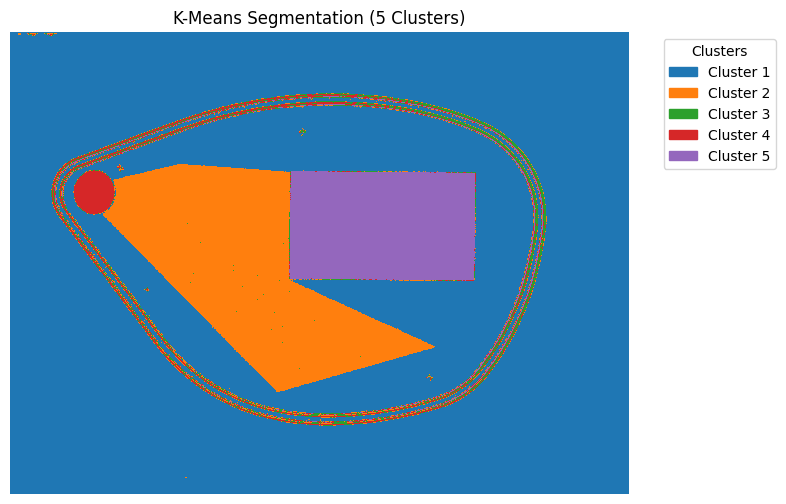

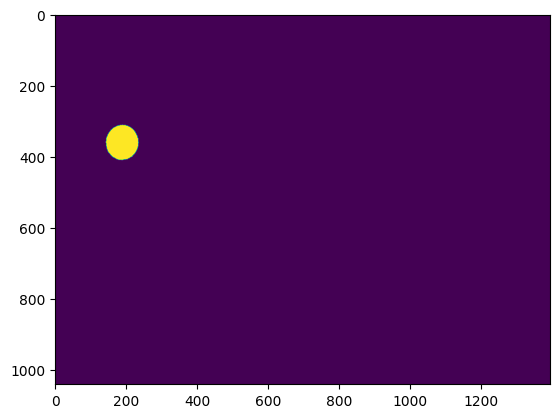

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


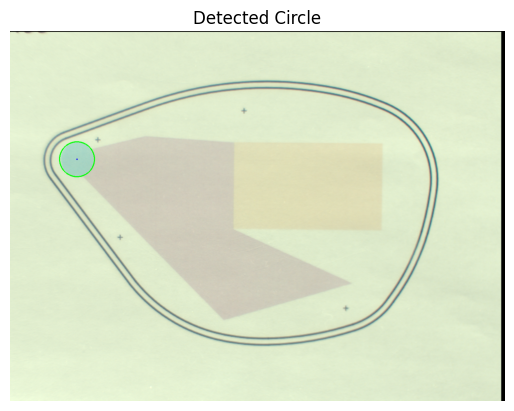

Processing d3...
[[ 9.99582770e-01  4.75584110e-03 -2.03449026e+01]
 [-4.75584110e-03  9.99582770e-01  1.08728421e+01]]


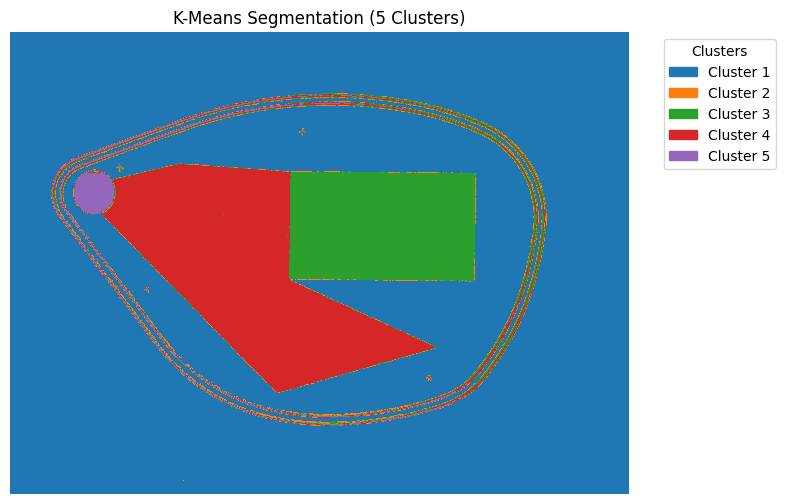

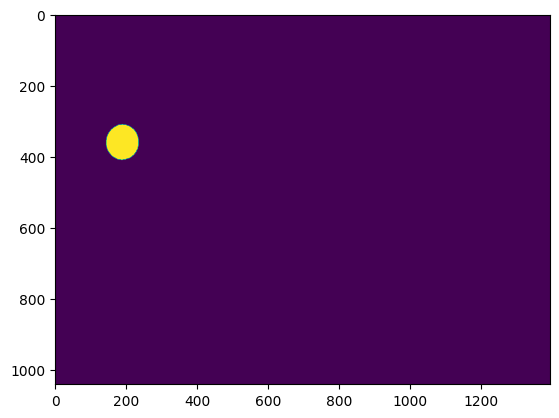

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


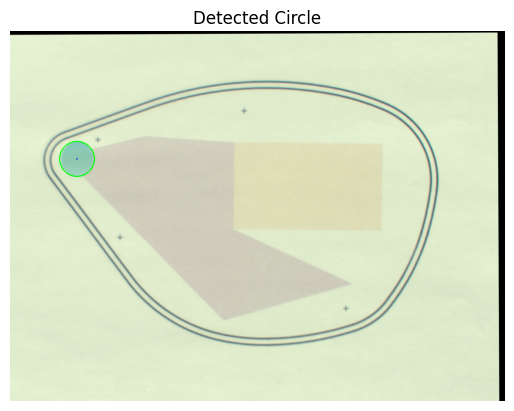

Processing d4...
[[ 9.99859869e-01  2.42482050e-03 -1.90228394e+01]
 [-2.42482050e-03  9.99859869e-01  6.95203228e+00]]


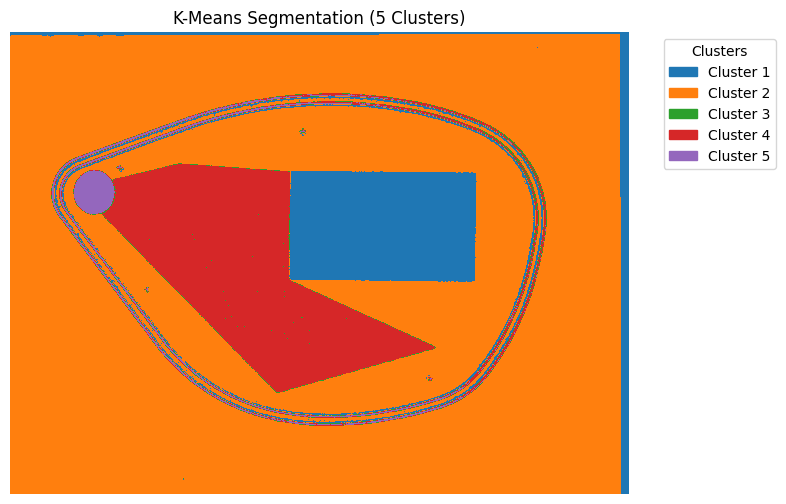

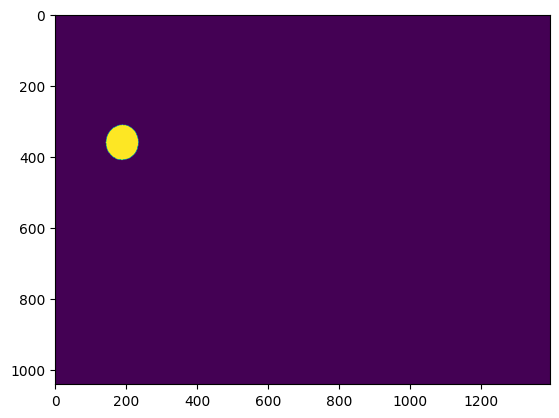

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


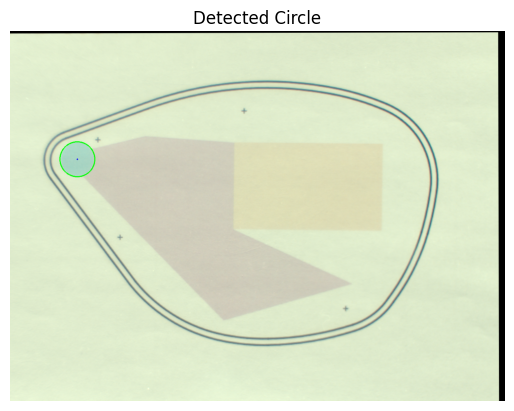

Processing d7...
[[ 9.99698979e-01  7.26237771e-04 -1.80254844e+01]
 [-7.26237771e-04  9.99698979e-01  6.64693583e+00]]


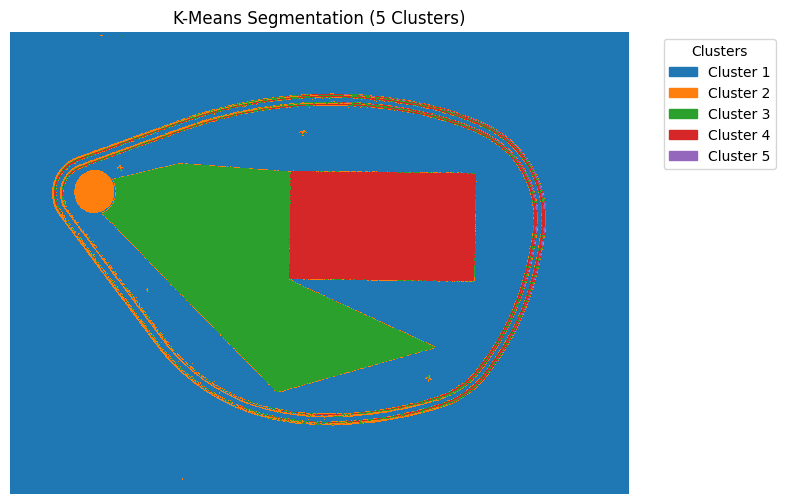

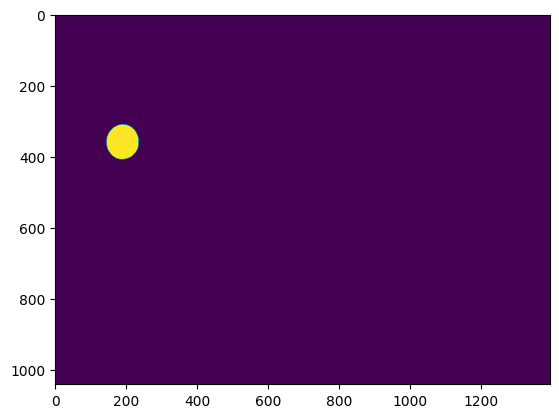

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


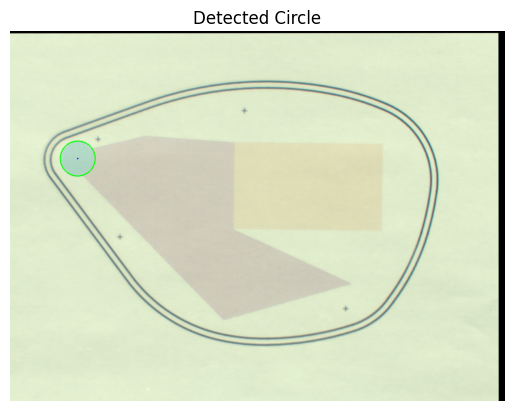

Processing d10...
[[ 9.99409310e-01  9.33178550e-03 -1.96933861e+01]
 [-9.33178550e-03  9.99409310e-01  1.39276191e+01]]


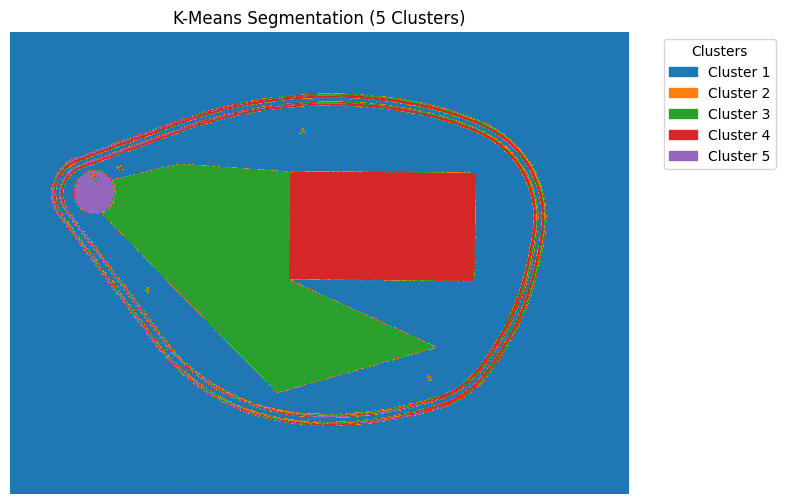

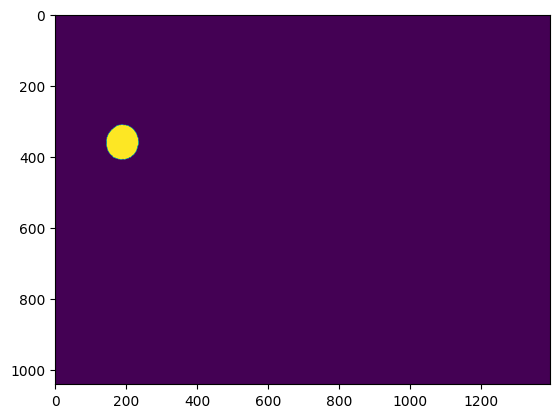

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


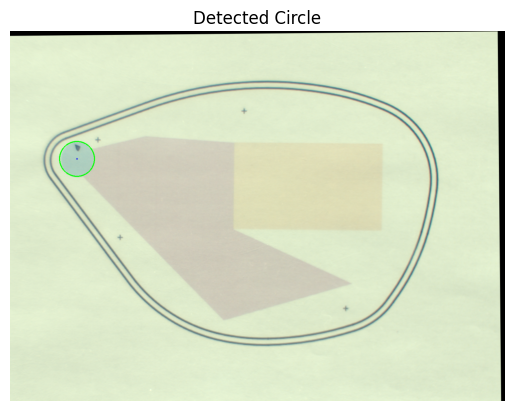

Processing d12...
[[ 9.99024473e-01  1.08443535e-02 -2.87398215e+01]
 [-1.08443535e-02  9.99024473e-01  1.56858677e+01]]


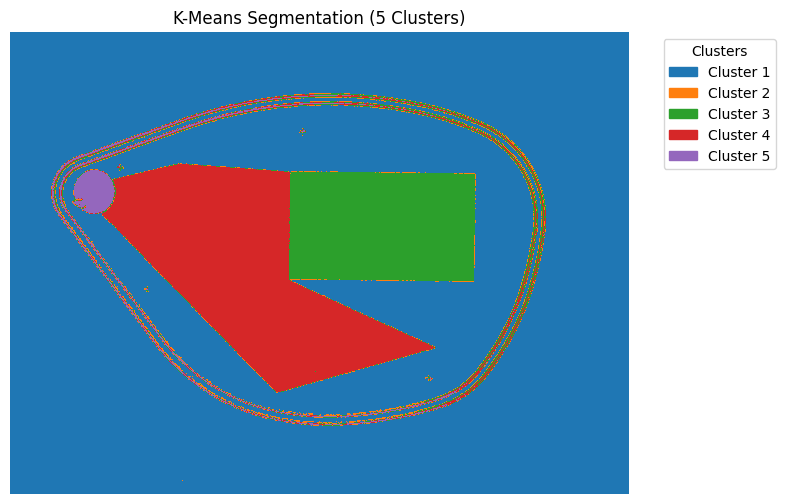

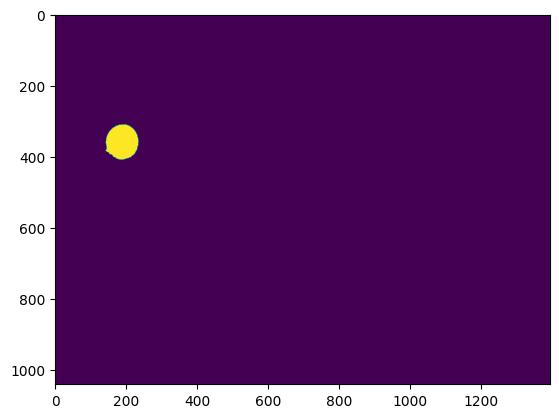

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


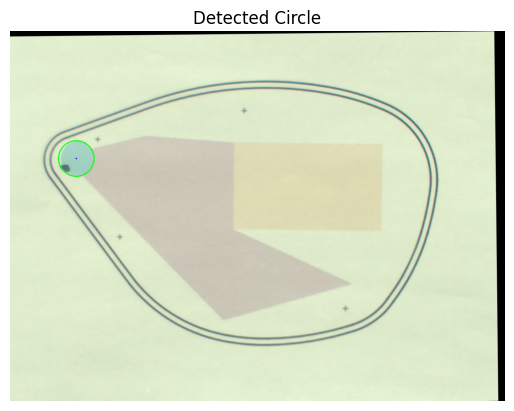

Processing d13...
[[ 9.99713407e-01  6.41981097e-03 -1.90419719e+01]
 [-6.41981097e-03  9.99713407e-01  1.01913933e+01]]


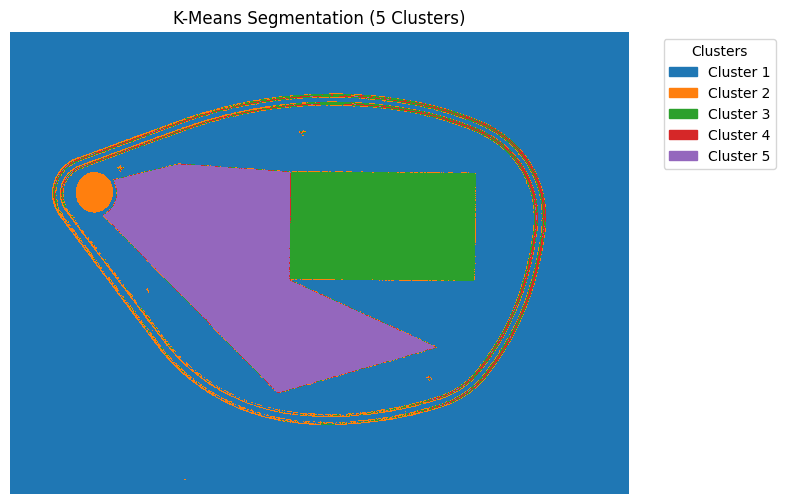

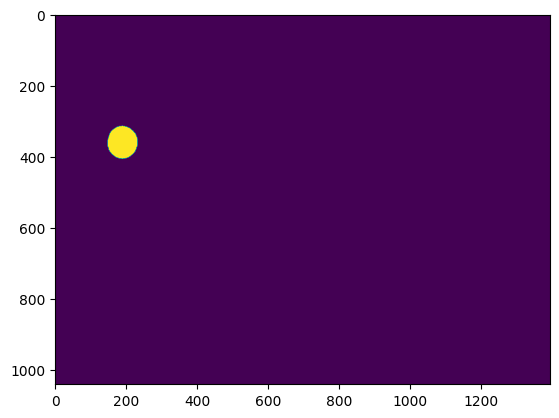

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


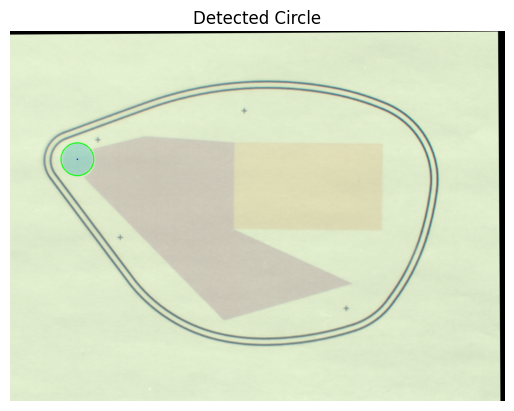

Processing d18...
[[ 1.00007675e+00  3.36528313e-03 -2.41377301e+01]
 [-3.36528313e-03  1.00007675e+00  1.05335832e+01]]


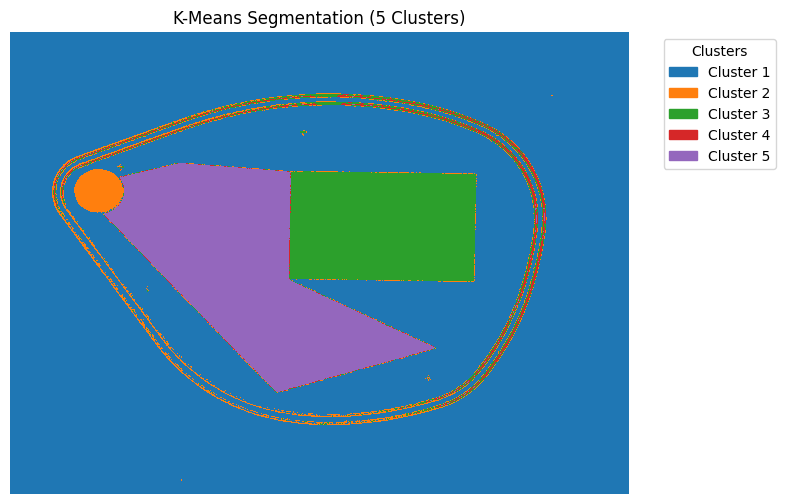

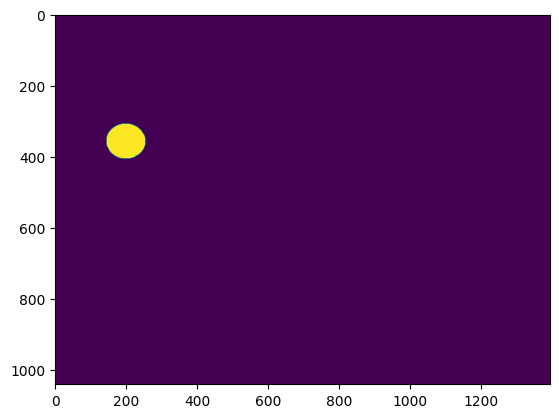

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


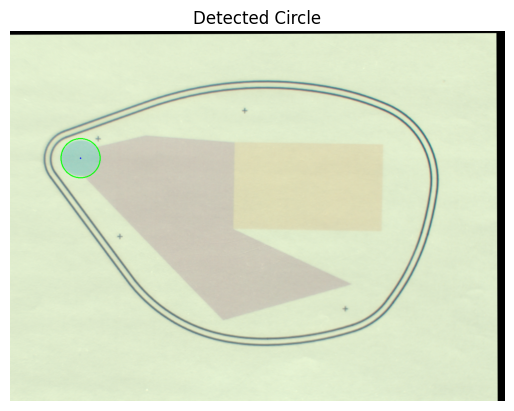

Processing d19...
[[ 9.99794411e-01  5.44441027e-03 -4.35842290e+01]
 [-5.44441027e-03  9.99794411e-01  5.51285955e+00]]


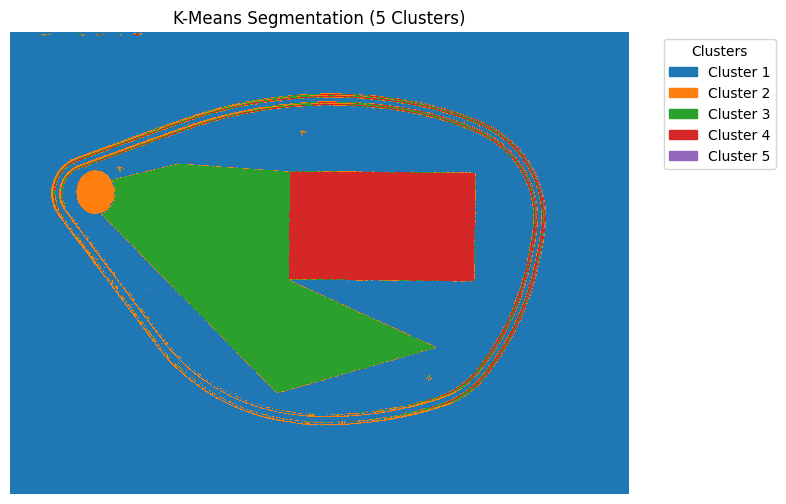

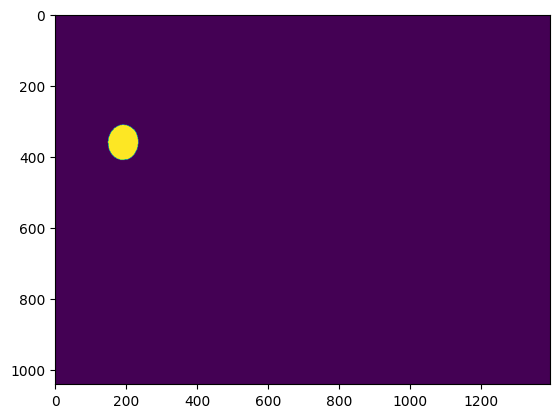

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


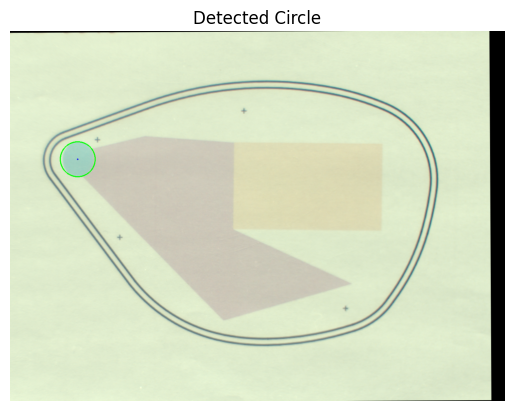

Processing d20...
[[ 9.99725003e-01  4.63773516e-03 -2.04030984e+01]
 [-4.63773516e-03  9.99725003e-01  1.06216092e+01]]


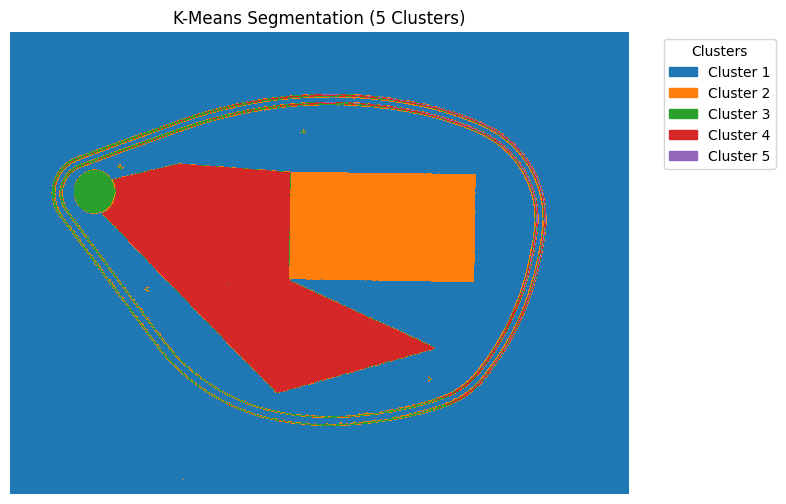

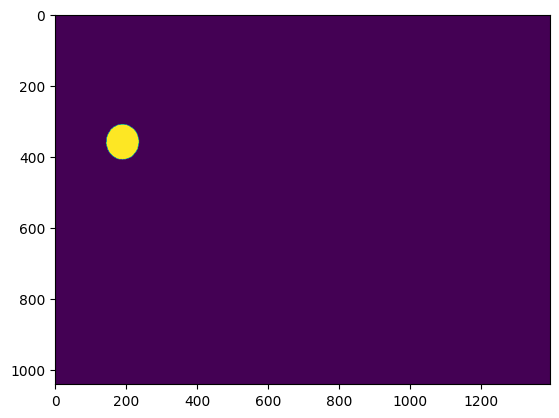

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


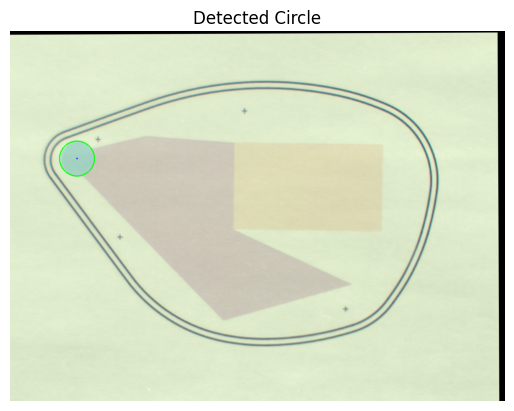

Processing d21...
[[ 1.00004074e+00  2.74060187e-03 -9.11516287e+00]
 [-2.74060187e-03  1.00004074e+00  5.84318072e+00]]


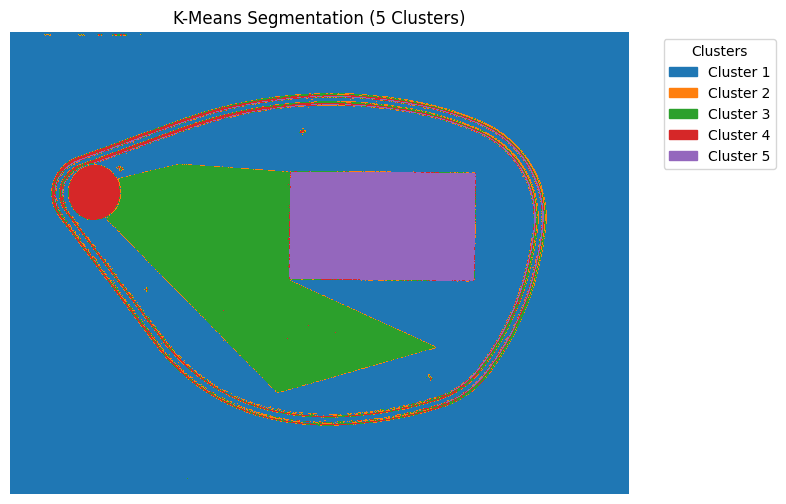

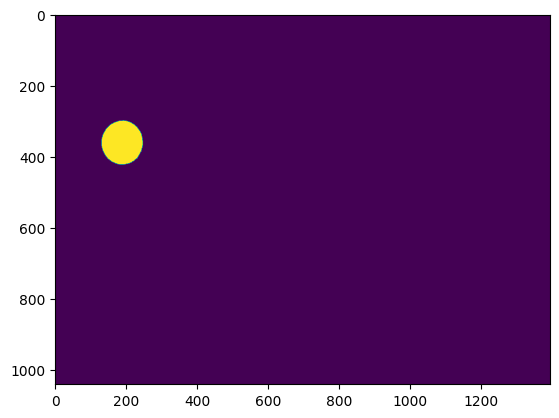

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


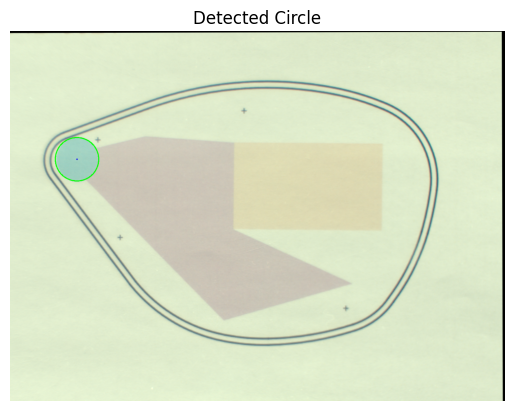

Processing d22...
[[ 1.00090771e+00  1.59528647e-02 -3.14002849e+01]
 [-1.59528647e-02  1.00090771e+00  6.64931140e+00]]


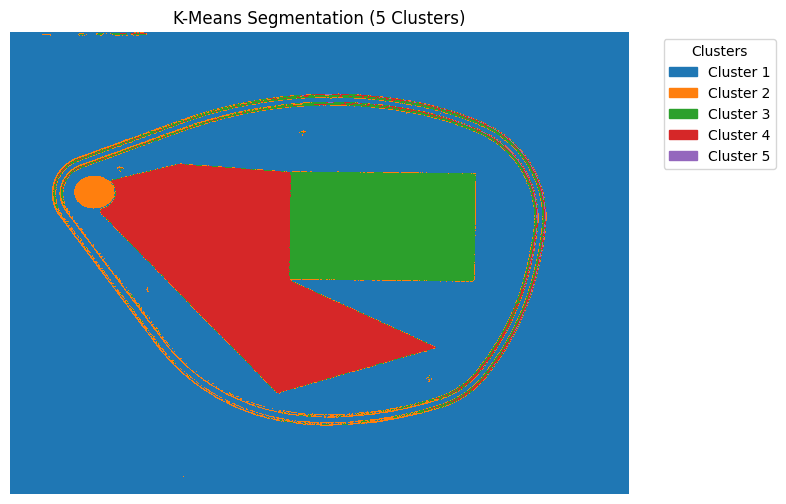

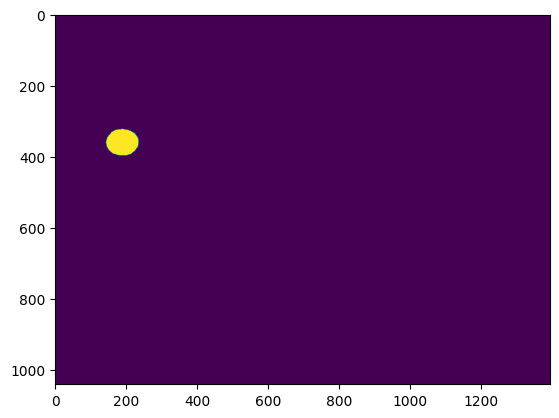

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


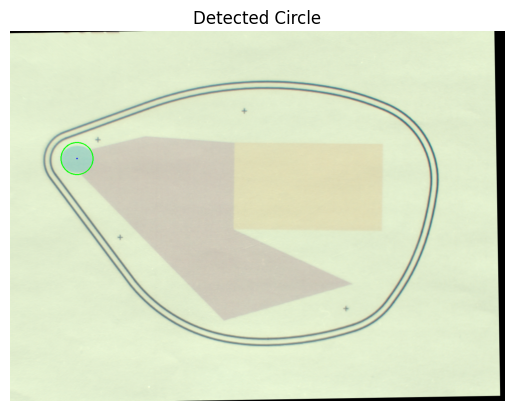

In [8]:
deltaE_results = []
defects_radius = []
defects_aligned = []

for i, defect_name in enumerate(defects):
    print(f"Processing {defect_name}...")

    # CTQ2 (in RGB)
    # Align defect
    A_3x3 = defect_homographies[i]
    print(A_3x3)
    A_2x3 = A_3x3[:2, :]
    defect_rgb = spim2rgb(defect_cubes[defect_name], wavelengths)
    h, w, b = defect_rgb.shape
    aligned_defect = cv2.warpAffine(defect_rgb, A_2x3, (w, h))
    defects_aligned.append(aligned_defect)

    # Compute defect mask of IC to find circle radius
    defect_mask = compute_IC_mask(defect_rgb, A_2x3, True, circle_center)
    defect_circle_info = get_circle_info(defect_mask, aligned_defect, True)
    defects_radius.append(defect_circle_info["min_enclosing_circle"]["radius"])

    # Masked CTQ for visualization
    cropped_circle = crop_circle(aligned_defect, circle_center, circle_radius)
    cropped_circles.append(cropped_circle)

    # CTQ1 (all spectra)
    # Compute spectral average
    cube = defect_cubes[defect_name]
    bands, h, w = cube.shape

    # Align full cube
    cube_aligned = np.stack(
        [cv2.warpAffine(cube[j], A_3x3[:2, :], (w, h)) for j in range(bands)]
    )

    # Spectral to XYZ to LAB
    cube_interp, _ = interpolate_spectral_cube(
        cube_aligned, wavelengths, wl_min=360, wl_max=830, wl_step=10
    )
    cube_interp = np.transpose(cube_interp, (1, 2, 0))  # (H, W, b)

    def_XYZ = spim2XYZ(cube_interp, new_wavelengths, "D65")
    def_LAB = XYZ2Lab(def_XYZ, new_wavelengths, "D65")

    # CIelab delta E with reference
    DE_mean = calculate_delta_E(ref_LAB, def_LAB, mask=mask_ref)
    deltaE_results.append(DE_mean)

In [9]:
defects_radius

[49.52029800415039,
 49.62368392944336,
 49.42386245727539,
 49.268001556396484,
 49.039493560791016,
 50.30120086669922,
 46.075077056884766,
 55.24054718017578,
 49.35249328613281,
 49.256492614746094,
 61.844696044921875,
 45.69131851196289]

7. Create df to save results


In [10]:
# Save results to df
result_df = pd.DataFrame()
result_df["defect_id"] = defects
result_df["DE_mean"] = deltaE_results
result_df["radius"] = defects_radius
result_df["CTQ1"] = np.array(deltaE_results) > 2.8
result_df["CTQ2"] = abs(np.array(defects_radius) - circle_radius) > 1.2 # new reference  50 
result_df["Defect?"] = result_df["CTQ1"] | result_df["CTQ2"]
result_df.to_csv(f"deltaE_results_{test}_{operator}.csv", index=False)
print("\nAverage DE (CIE2000) values per defect:")
print(result_df)


Average DE (CIE2000) values per defect:
   defect_id   DE_mean     radius   CTQ1   CTQ2  Defect?
0         d0  0.962147  49.520298  False  False    False
1         d3  5.772093  49.623684   True  False     True
2         d4  1.107909  49.423862  False  False    False
3         d7  2.397279  49.268002  False  False    False
4        d10  4.914529  49.039494   True  False     True
5        d12  2.825928  50.301201   True  False     True
6        d13  1.480632  46.075077  False   True     True
7        d18  1.695438  55.240547  False   True     True
8        d19  1.689975  49.352493  False  False    False
9        d20  1.285784  49.256493  False  False    False
10       d21  1.841420  61.844696  False   True     True
11       d22  2.849075  45.691319   True   True     True


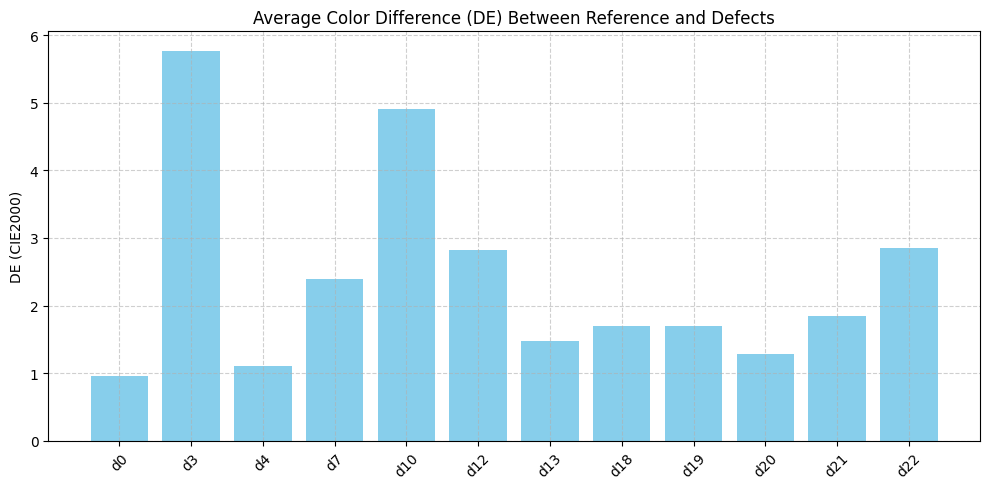

In [11]:
# Plot delta E differences
plt.figure(figsize=(10, 5))
plt.bar(result_df["defect_id"], result_df["DE_mean"], color="skyblue")
plt.ylabel("DE (CIE2000)")
plt.title("Average Color Difference (DE) Between Reference and Defects")
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

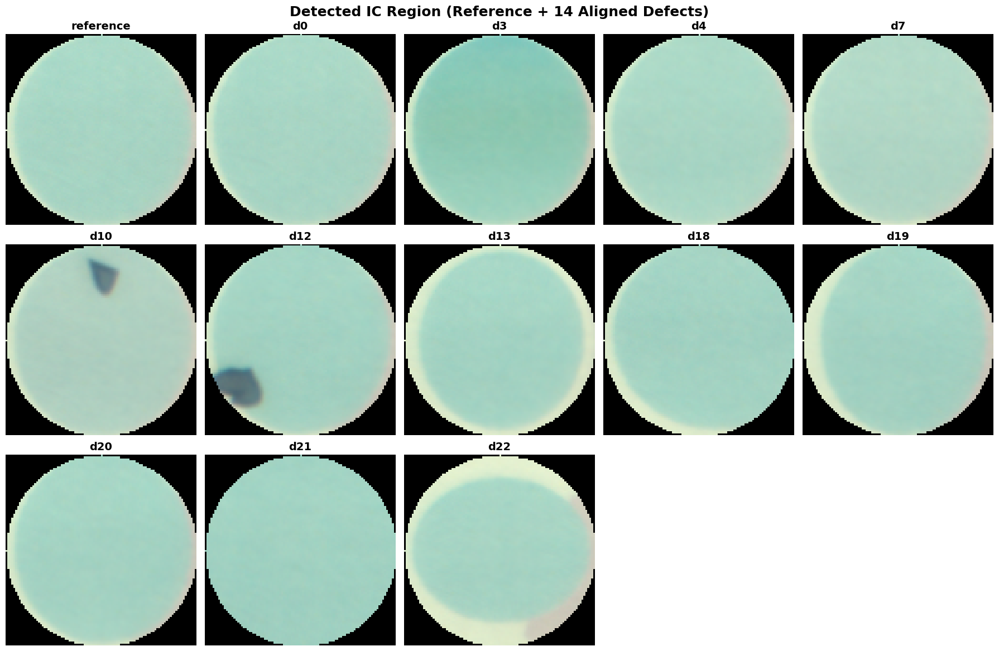

In [12]:
# Plot masked IC region
titles = ["reference"] + defects
plt.figure(figsize=(18, 12))
cols = 5
rows = math.ceil((len(defects) + 1) / cols)
for idx, (img, title) in enumerate(zip(cropped_circles, titles)):
    plt.subplot(rows, cols, idx + 1)
    if img.ndim == 2:
        plt.imshow(img, cmap="gray")
    else:
        plt.imshow(img)
    plt.title(title, fontsize=14, fontweight="bold")
    plt.axis("off")

plt.suptitle(
    "Detected IC Region (Reference + 14 Aligned Defects)",
    fontsize=18,
    fontweight="bold",
)
plt.tight_layout()
plt.show()

6. Average reflectance in Circle


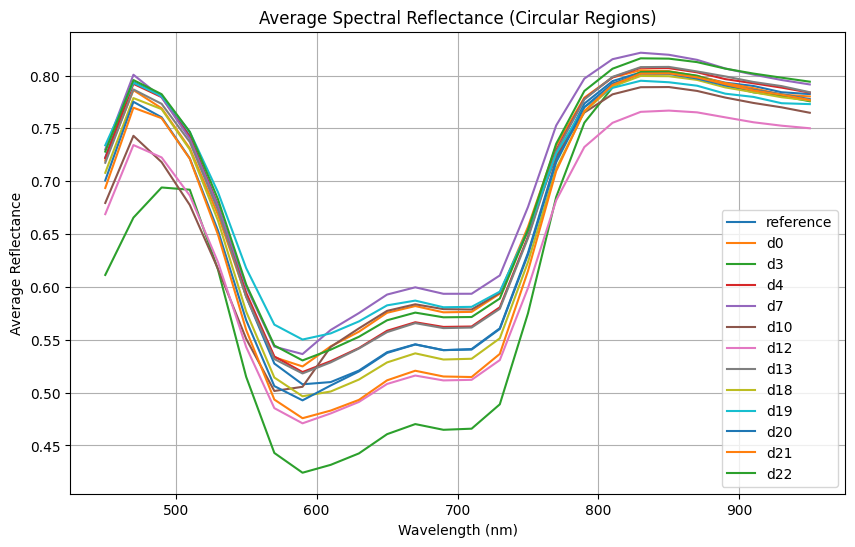

In [13]:
# Plot average spectra of each defect
for defect_name in defects:
    cube = defect_cubes[defect_name]
    spec = average_reflectance_in_circle(
        cube, circle_center, circle_radius, transform=A_3x3
    )
    spectra[defect_name] = spec
plt.figure(figsize=(10, 6))
for name, spectrum in spectra.items():
    # if name == "reference" or name == "d4":
    #     plt.plot(wavelengths, spectrum, label=name)
    plt.plot(wavelengths, spectrum, label=name)

plt.xlabel("Wavelength (nm)")
plt.ylabel("Average Reflectance")
plt.title("Average Spectral Reflectance (Circular Regions)")
plt.legend()
plt.grid(True)
plt.show()

In [14]:
def std_reflectance_in_circle(hypercube, center, radius, transform=None):
    bands, h, w = hypercube.shape

    hypercube_aligned = np.stack(
        [cv2.warpAffine(hypercube[i], transform, (w, h)) for i in range(bands)]
    )

    mask = np.zeros((h, w), dtype=np.uint8)
    cx, cy = int(round(center[0])), int(round(center[1]))
    r = int(radius) - 5
    cv2.circle(mask, (cx, cy), r, 1, -1)

    std_reflectance = []
    for i in range(bands):
        band = hypercube_aligned[i]
        masked_pixels = band[mask == 1]
        if masked_pixels.size > 0:
            std_reflectance.append(np.std(masked_pixels))
        else:
            std_reflectance.append(np.nan)

    return np.array(std_reflectance)


new_spectra = {}
new_spectra_std = {}

for defect_name, transform in zip(defects, defect_homographies):
    cube = defect_cubes[defect_name]
    new_spectra[defect_name] = average_reflectance_in_circle(
        cube, circle_center, circle_radius, transform=transform
    )
    new_spectra_std[defect_name] = std_reflectance_in_circle(
        cube, circle_center, circle_radius, transform=transform
    )


for defect_name in defects:
    std_values = new_spectra_std[defect_name]
    mean_values = new_spectra[defect_name]

    print(
        f"{defect_name}: Mean Std across wavelengths = {np.nanmean(std_values):.6f}, Coefficient of Variation (mean) = {np.nanmean(std_values/mean_values)*100:.2f}%"
    )

d0: Mean Std across wavelengths = 0.018135, Coefficient of Variation (mean) = 2.73%
d3: Mean Std across wavelengths = 0.021852, Coefficient of Variation (mean) = 3.92%
d4: Mean Std across wavelengths = 0.016301, Coefficient of Variation (mean) = 2.45%
d7: Mean Std across wavelengths = 0.018585, Coefficient of Variation (mean) = 2.71%
d10: Mean Std across wavelengths = 0.061226, Coefficient of Variation (mean) = 9.57%
d12: Mean Std across wavelengths = 0.084981, Coefficient of Variation (mean) = 13.64%
d13: Mean Std across wavelengths = 0.027593, Coefficient of Variation (mean) = 4.45%
d18: Mean Std across wavelengths = 0.020777, Coefficient of Variation (mean) = 3.41%
d19: Mean Std across wavelengths = 0.027230, Coefficient of Variation (mean) = 4.56%
d20: Mean Std across wavelengths = 0.017261, Coefficient of Variation (mean) = 2.66%
d21: Mean Std across wavelengths = 0.015517, Coefficient of Variation (mean) = 2.45%
d22: Mean Std across wavelengths = 0.047376, Coefficient of Variatio

In [15]:
avg_std_per_defect = {
    name: np.nanmean(std_values) for name, std_values in new_spectra_std.items()
}

sorted_defects = sorted(avg_std_per_defect.items(), key=lambda x: x[1], reverse=True)
for rank, (name, std_val) in enumerate(sorted_defects, 1):
    print(f"{name}: {std_val:.6f}")

d12: 0.084981
d10: 0.061226
d22: 0.047376
d13: 0.027593
d19: 0.027230
d3: 0.021852
d18: 0.020777
d7: 0.018585
d0: 0.018135
d20: 0.017261
d4: 0.016301
d21: 0.015517
